# Fine-tuned LLAVA based on art paintings

LLaVa is an exciting new multimodal LLM which extends large language models like [LLaMa](https://huggingface.co/docs/transformers/model_doc/llama) with visual inputs.

For multimodal LLMs, one typically takes a pre-trained/fine-tuned LLM and additionally conditions it on image features. In case of LLaVa, the image features come from a pre-trained [CLIP](https://huggingface.co/docs/transformers/model_doc/clip)'s vision encoder. To match the dimension of the image features with those of the text features, one applies a projection module, which could be a simple linear projection (like the original LLaVa), or more sophisticated like a two-layer MLP (used in LLaVa 1.5).

One then trains the model to predict the next text token, given image features and text tokens.

![image/png](https://cdn-uploads.huggingface.co/production/uploads/62441d1d9fdefb55a0b7d12c/FPshq08TKYD0e-qwPLDVO.png)

* Transformers docs: https://huggingface.co/docs/transformers/main/en/model_doc/llava.
* Original LLaVa paper: https://arxiv.org/abs/2304.08485
* LLaVa 1.5 paper: https://arxiv.org/pdf/2310.03744.pdf
* [notebook](https://colab.research.google.com/drive/1qsl6cd2c8gGtEW1xV5io7S8NHh-Cp1TV?usp=sharing#scrollTo=6Bx8iu9jOssW) which inspired me to create this notebook.

## Set-up environment

Let's start by installing the necessary libraries. Here we install Accelerate and Bitsandbytes in order to load the model in Google Colab. This enables [4-bit inference](https://huggingface.co/blog/4bit-transformers-bitsandbytes) with clever quantization techniques, shrinking the size of the model considerably, while maintaining performance of the original size.

In [19]:
!pip install --upgrade -q accelerate bitsandbytes

We also update the Transformers version of Google Colab to use the main branch, as the model is brand new at the time of writing.

In [20]:
!pip install git+https://github.com/huggingface/transformers.git

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-klt103_0
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-klt103_0
  Resolved https://github.com/huggingface/transformers.git to commit 6c1295a0d8795d122670d44614d5eb4e37000fa5
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


## Load model and processor

Next, we load a model and corresponding processor from the hub. We specify device_map="auto" in order to automatically place the model on the available GPUs/CPUs (see [this guide](https://huggingface.co/docs/accelerate/usage_guides/big_modeling) for details).

Regarding [quantization](https://huggingface.co/blog/4bit-transformers-bitsandbytes), refer to the blog post for all details.

In [21]:
from transformers import AutoProcessor, LlavaForConditionalGeneration
from transformers import BitsAndBytesConfig
import torch

quantization_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16
)


model_id = "llava-hf/llava-1.5-7b-hf"

processor = AutoProcessor.from_pretrained(model_id)
model = LlavaForConditionalGeneration.from_pretrained(model_id, quantization_config=quantization_config, device_map="auto")

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
/usr/local/lib/python3.10/dist-packages/transformers/models/llava/configuration_llava.py:103: FutureWarning: The `vocab_size` argument is deprecated and will be removed in v4.42, since it can be inferred from the `text_config`. Passing this argument has no effect
  warnings.warn(


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

## Load dataSet

We load the dataset we used. We use SemArt Dataset, a multi-modal dataset for semantic art understanding. SemArt is a collection of fine-art painting images in which each image is associated to a number of attributes and a textual artistic comment, such as those that appear in art catalogues or museum collections. It contains 21,384 samples that provides artistic comments along with fine-art paintings and their attributes for studying semantic art understanding.

Regarding [quantization](https://paperswithcode.com/dataset/semart), refer to the blog post for all details.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!unzip "/content/drive/Shareddrives/COMP 646/SemArt.zip" -d "/content/"

流式输出内容被截断，只能显示最后 5000 行内容。
  inflating: /content/SemArt/Images/23442-maurizio.jpg  
  inflating: /content/SemArt/Images/23443-maurizix.jpg  
  inflating: /content/SemArt/Images/23444-nativity.jpg  
  inflating: /content/SemArt/Images/23445-sforza1.jpg  
  inflating: /content/SemArt/Images/23446-sforza2.jpg  
  inflating: /content/SemArt/Images/23447-catherin.jpg  
  inflating: /content/SemArt/Images/23449-f_martyr.jpg  
  inflating: /content/SemArt/Images/23450-holy_fam.jpg  
  inflating: /content/SemArt/Images/23451-jerome.jpg  
  inflating: /content/SemArt/Images/23453-mad_chil.jpg  
  inflating: /content/SemArt/Images/23454-mad_rose.jpg  
  inflating: /content/SemArt/Images/23455-madonna.jpg  
  inflating: /content/SemArt/Images/23457-magdalen.jpg  
  inflating: /content/SemArt/Images/23458-nursing.jpg  
  inflating: /content/SemArt/Images/23459-portlady.jpg  
  inflating: /content/SemArt/Images/23460-salome.jpg  
  inflating: /content/SemArt/Images/23461-salome1.jpg  
  inflating: 

In [ ]:
#explore the data
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Set the path to the unzipped dataset
dataset_path = "/content/SemArt"

# Get a list of all files in the dataset directory
file_list = os.listdir(dataset_path)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the training data and validation data
train_data = pd.read_csv("/content/SemArt/semart_train.csv", sep="\t", encoding="latin-1")
val_data = pd.read_csv("/content/SemArt/semart_val.csv", sep="\t", encoding="latin-1")


In [ ]:
import os
from PIL import Image

# Path to the directory containing the images
images_dir = "/content/SemArt/Images/"

# Function to load an image based on the filename
def load_image(filename):
    image_path = os.path.join(images_dir, filename)
    return Image.open(image_path)

# Iterate over each row in the DataFrame
for index, row in train_data.iterrows():
    filename = row["IMAGE_FILE"]
    image = load_image(filename)

    # Paste and splice the image into the DataFrame
    train_data.at[index, "IMAGE"] = image
    val_data.at[index, "IMAGE"] = image
# Display the first few rows of the updated DataFrame
print("First few rows of the updated data:")
print(train_data.head())
print(val_data.head())

First few rows of the updated data:
           IMAGE_FILE                                        DESCRIPTION  \
0   19873-1darmst.jpg  The Meyer or Darmstadt Madonna is the last, mo...   
1  18759-guard301.jpg  Whereas Canaletto incorporates classically ins...   
2  04589-temptati.jpg  In this painting the refinement of the colouri...   
3      15104-magi.jpg  The left side of the painting was cut, origina...   
4  36582-paolo_f1.jpg  The painting illustrates a famous episode from...   

                      AUTHOR  \
0  HOLBEIN, Hans the Younger   
1          GUARDI, Francesco   
2         BILIVERT, Giovanni   
3     GEERTGEN tot Sint Jans   
4              SCHEFFER, Ary   

                                               TITLE  \
0                                  Darmstadt Madonna   
1                  Landscape with a Fisherman's Tent   
2               The Temptation of Charles and Ubalde   
3                              Adoration of the Magi   
4  The Ghosts of Paolo and Frances

## Style

In [ ]:
!unzip "/content/drive/Shareddrives/COMP 646/resnet50.zip" -d "/content/"

Archive:  /content/drive/Shareddrives/COMP 646/resnet50.zip
  inflating: /content/beit.pth       
  inflating: /content/resnet50.pth   


In [23]:
from torchvision import transforms
from PIL import Image
import torch
from torch import nn
import torchvision.models as models
from transformers import BeitForImageClassification, ViTForImageClassification

def preprocess_image(image):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    return transform(image).unsqueeze(0)

class IntegratedModel(nn.Module):
    def __init__(self, weight_resnet=0.43, weight_beit=0.57, num_labels=27):
        super(IntegratedModel, self).__init__()
        self.model_resnet = models.resnet50(pretrained=False)
        num_features = self.model_resnet.fc.in_features
        self.model_resnet.fc = nn.Linear(num_features, num_labels)
        self.weight_beit = weight_beit
        self.weight_vit = 0.43

        self.model_beit = BeitForImageClassification.from_pretrained(
            'microsoft/beit-base-patch16-224-pt22k-ft22k',
            num_labels=num_labels,
            ignore_mismatched_sizes=True
        )
        self.model_vit = ViTForImageClassification.from_pretrained(
            'google/vit-base-patch16-224-in21k',
            num_labels=num_labels,
            ignore_mismatched_sizes=True
        )

    def forward(self, x):
        resnet_output = self.model_resnet(x)
        beit_output = self.model_beit(x).logits
        vit_output = self.model_vit(x).logits
        integrated_output = (self.weight_resnet * resnet_output +
                             self.weight_beit * beit_output)
        return integrated_output

    def load_weights(self, vit_path=None, beit_path=None, resnet_weights=None):
        if resnet_weights:
            self.model_resnet.load_state_dict(resnet_weights, strict=False)

        if beit_path:
            beit_weights = torch.load(beit_path, map_location=device)
            self.model_beit.load_state_dict(beit_weights, strict=False)

        if vit_path:
            vit_weights = torch.load(vit_path, map_location=device)
            self.model_vit.load_state_dict(vit_weights, strict=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
integrated_model = IntegratedModel().to(device)

integrated_model.load_weights('resnet50.pth', 'beit.pth')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Some weights of BeitForImageClassification were not initialized from the model checkpoint at microsoft/beit-base-patch16-224-pt22k-ft22k and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([21841, 768]) in the checkpoint and torch.Size([27, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([21841]) in the checkpoint and torch.Size([27]) in the model instantiated
You should probably TRAIN this model on a down-str

## Test model （3 forms）

We compared the output of the model in three situations. The first one is a pure picture for the model to appreciate. 2 is to input pictures + given simple information for appreciation (such as author, title, etc.) 3 is to add an information retrieval wiki part outside the model as an output together with the input.

It can be seen from the results that the pure picture input appreciation of 1 is the simplest, and the model can only briefly describe the picture. 2 is a little more complicated. The model can infer what the painting is about, but the model cannot accurately determine the specific information and ideas of the painting. 3. After adding information-enhanced retrieval, the model can accurately and richly describe the relevant information of the painting, such as the creation time, creator and other information, and can well explain the painting, the ideas behind it, and the historical background and other related information.

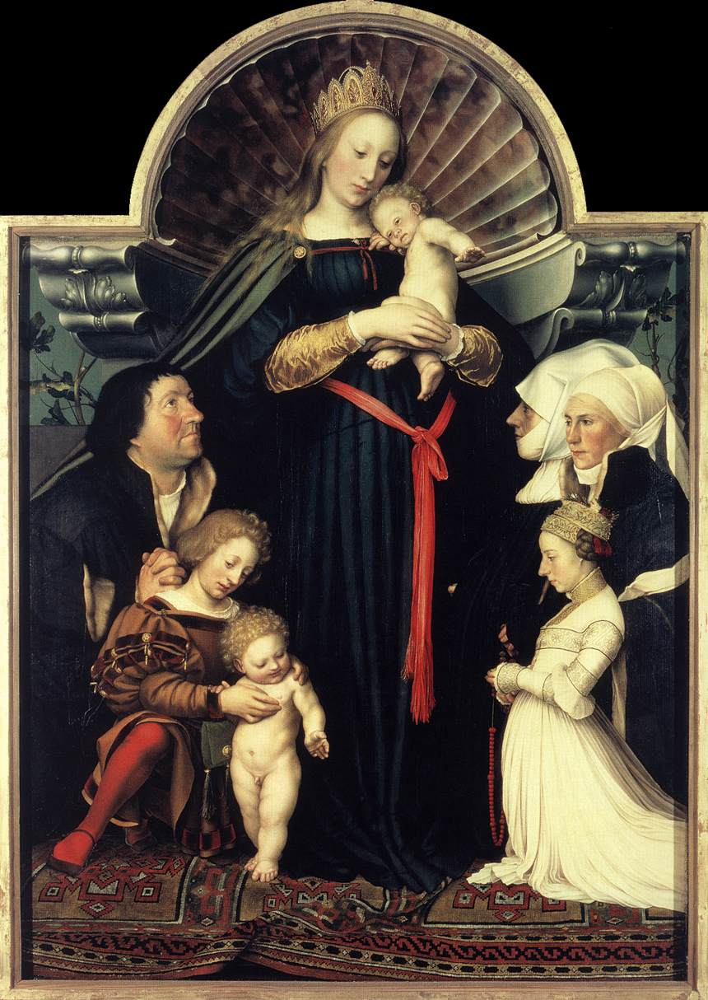

 The painting depicts a scene where a woman, possibly Mary, is holding a baby. She is surrounded by several other people, including a man and a child. The woman appears to be the center of attention, as she is holding the baby close to her. The painting seems to convey a sense of love, care, and protection, as the woman and the baby are the main focus of the scene. The other people in the painting might be family members or friends, emphasizing the importance of togetherness and support.


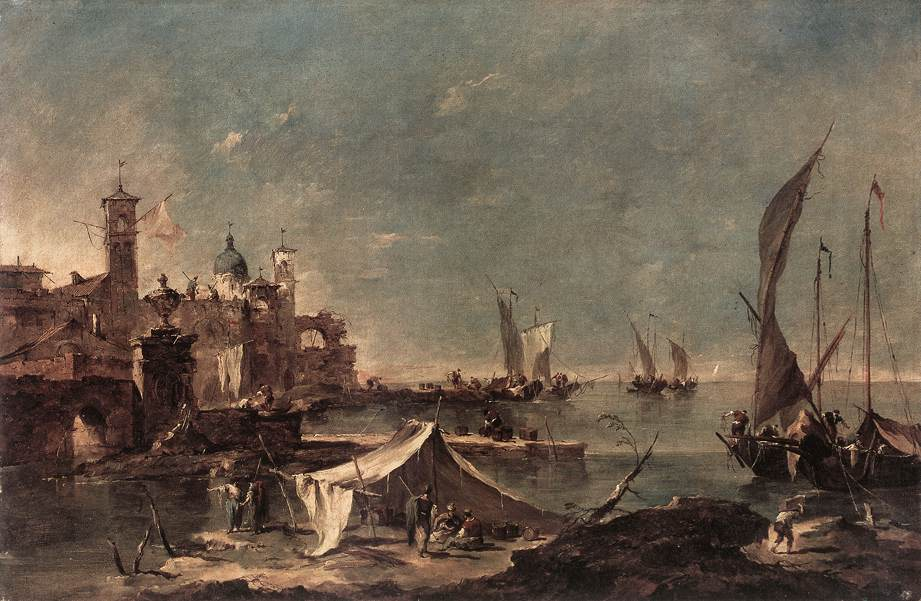

 The painting depicts a lively harbor scene with several boats floating on the water. There are at least 12 boats of varying sizes, some closer to the shore and others further out in the water. 

A group of people can be seen standing near the boats, possibly preparing to board or disembark. There are at least 11 people in the scene, some closer to the boats and others further away. The painting captures the bustling atmosphere of a harbor, with people and boats interacting and engaging in various activities.


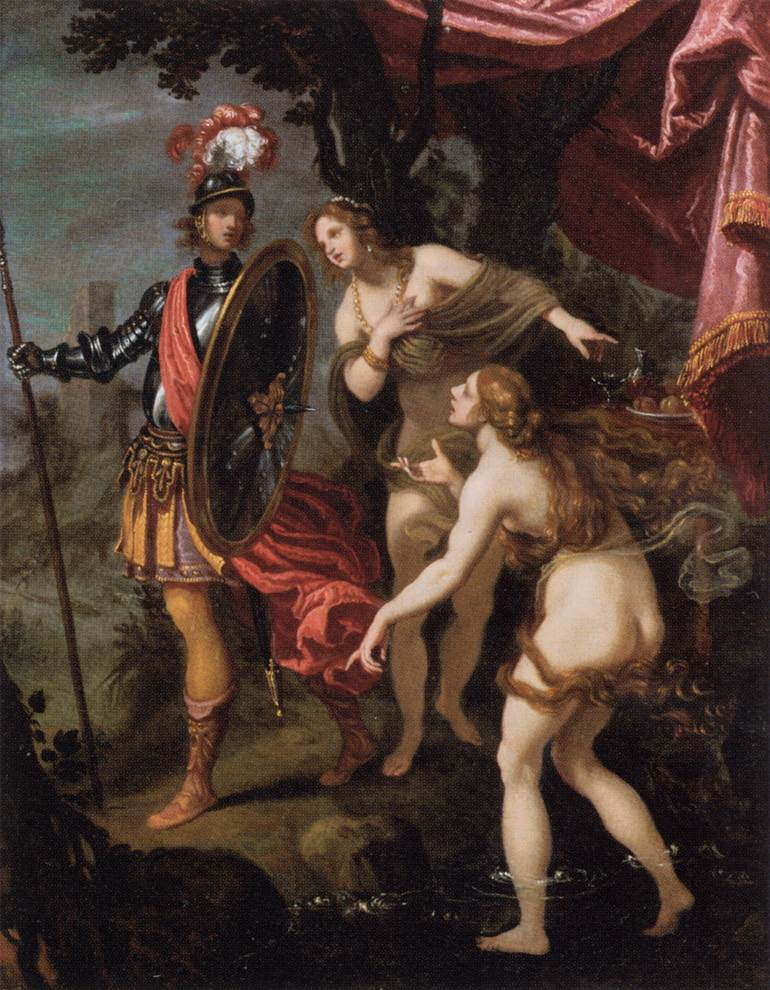

 The painting depicts a scene with a man wearing a helmet and holding a shield, standing next to a woman. They are both dressed in costumes, suggesting that they might be participating in a historical reenactment or a theatrical performance. The woman is wearing a dress, and the man is holding a sword.

In the background, there are two more people, one of whom is also holding a sword. The painting appears to be a mix of historical and fantasy elements, with the costumes and the presence of a shield and a sword. The overall atmosphere of the painting suggests a sense of adventure and excitement.


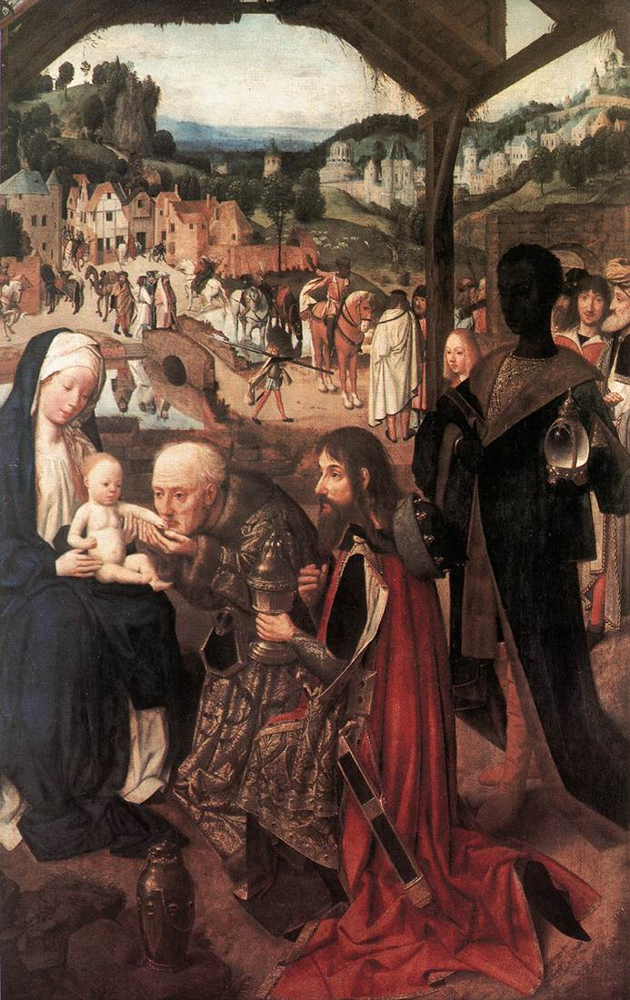

 The painting depicts a religious scene with several people, including a woman and a baby, kneeling down. There are also other people in the scene, some of whom are wearing armor. The painting appears to be a depiction of a religious event or gathering, with the people dressed in various attire.

The woman holding the baby is positioned in the center of the painting, while the other people are scattered around her. Some of the people are closer to the foreground, while others are further back in the scene. The painting captures the emotions and interactions of the people in the religious event, creating a sense of unity and devotion.


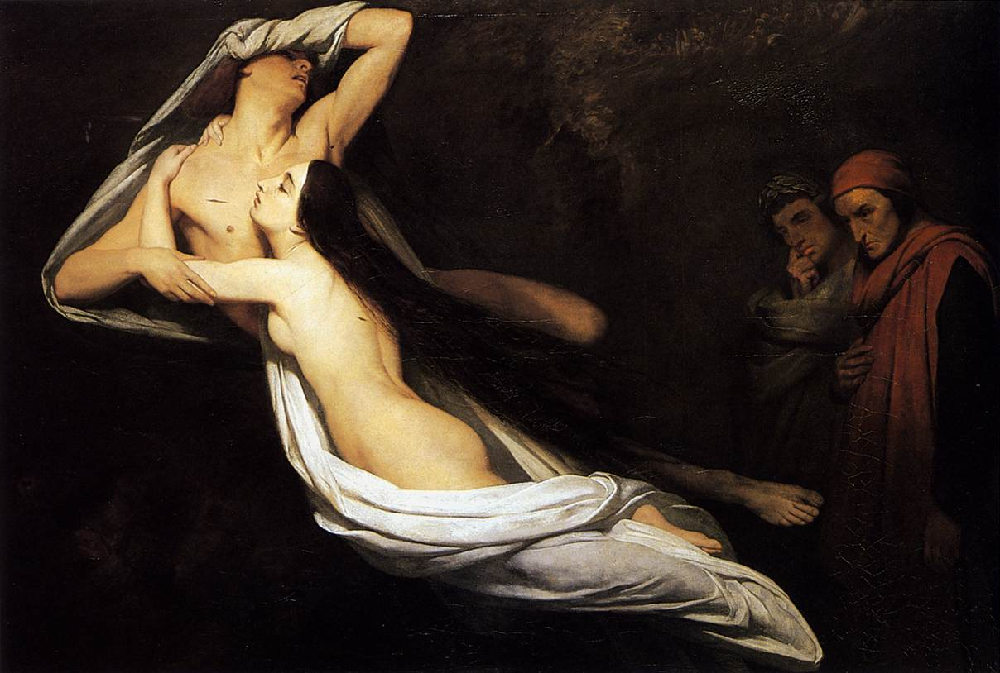

 The painting depicts a scene of a man and a woman lying together on a bed. The woman is positioned on the left side of the bed, while the man is on the right side. They appear to be in a passionate embrace, with the woman's arm around the man.

There are two other people in the scene, one standing on the left side of the bed and the other standing on the right side. The presence of these additional figures suggests that the main couple might be sharing their intimate moment with others, possibly friends or family members.


In [17]:
# pure image
import requests
from PIL import Image

# Function to process an image with the LLAMA model
def process_image(image):
    # Display the image
    display(image)

    # Prompt for the LLAMA model
    prompt = "USER: <image>\nThis is a painting in art, please describe the content of the picture in detail, and guess to understand the meaning of this painting is trying to convey\nASSISTANT:"

    # Prepare inputs for the LLAMA model
    inputs = processor(prompt, images=[image], padding=True, return_tensors="pt").to("cuda")

    # Generate text based on the image
    output = model.generate(**inputs, max_new_tokens=1000)
    generated_text = processor.batch_decode(output, skip_special_tokens=True)

    # Display the generated text
    for text in generated_text:
        print(text.split("ASSISTANT:")[-1])

# Iterate over the first five rows in the DataFrame
for index, row in train_data.head().iterrows():
    image = row["IMAGE"]
    process_image(image)


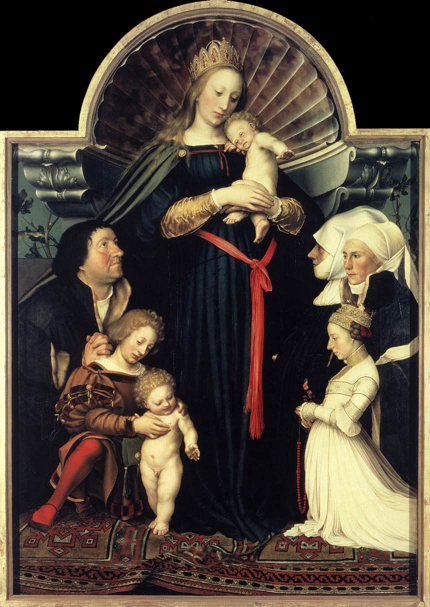

 The painting depicts a religious scene featuring a woman, possibly Mary, holding a baby. She is surrounded by several other people, including a man and a child, who are also part of the scene. The woman holding the baby is wearing a black gown, and the baby is being held close to her chest.

The painting is a religious artwork, possibly a depiction of the Virgin Mary holding her child, Jesus. The presence of other people in the scene might represent the people who were present during the birth of Jesus, such as the shepherds and the Magi. The painting is a representation of the religious beliefs and values of the time it was created.


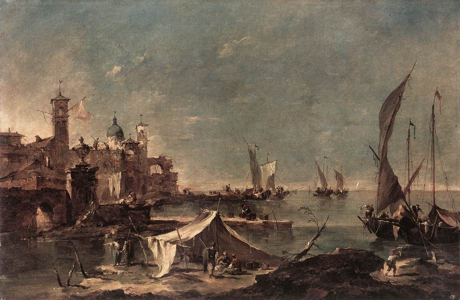

 The painting depicts a picturesque scene of a fisherman's tent set up on a beach. The tent is located near the water, and several boats can be seen floating in the water. There are also a few people scattered around the scene, possibly enjoying the beach or attending to their boats.

The painting captures the essence of a peaceful and relaxing environment, where people can unwind and connect with nature. The presence of the fisherman's tent suggests that the area is used for fishing activities, and the boats in the water indicate that the people in the scene are likely involved in such activities. Overall, the painting conveys a sense of tranquility and leisure, as people enjoy their time by the water.


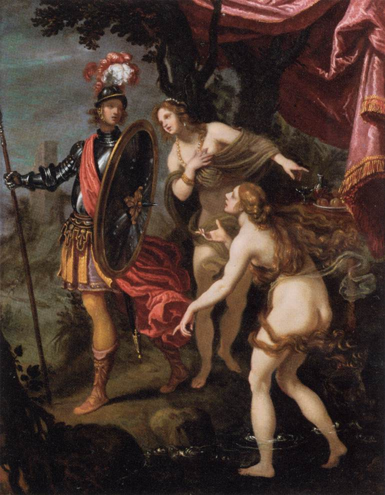

 The painting depicts a scene from the Bible, specifically the story of Adam and Eve. In the image, there are three main figures: a man, a woman, and a child. The man and woman are standing close to each other, while the child is positioned between them.

The man is wearing a helmet, which suggests that he might be a warrior or a guardian. The woman is holding a shield, which could be a defensive weapon or a symbol of protection. The child appears to be a young boy, and he is holding a bow and arrow.

The painting's theme revolves around temptation, as the man and woman are being tempted by the child, who is holding the bow and arrow. The child's actions might be interpreted as a test of faith or a challenge to the man and woman's beliefs.

The painting's religious context, along with the characters' attire and the objects they are holding, suggests that it is a representation of a biblical story or a moral lesson. The artist's intention might have been to convey a message about tempta

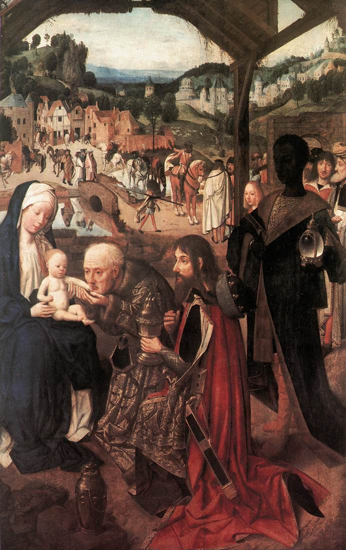

 The painting depicts a religious scene featuring a group of people, including a baby, kneeling in front of a woman who is holding the baby. The woman is wearing a blue dress, and the baby is being held by her. The people in the scene are dressed in medieval clothing, and there are several horses visible in the background.

The painting is a religious scene, possibly depicting the adoration of the Magi, which is a reference to the Magi, the three wise men who visited the baby Jesus. The presence of the baby and the woman holding the baby suggests a connection to the story of the Magi, who brought gifts to the baby Jesus. The medieval clothing and the horses in the background further emphasize the historical and religious context of the painting.


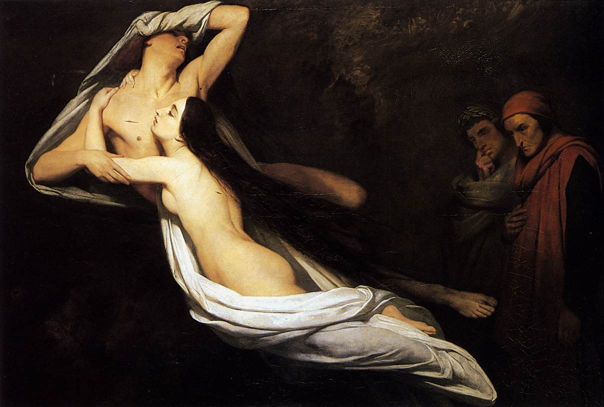

 The painting depicts a scene from Dante's "Divine Comedy," where the ghosts of Paolo and Francesca appear to Dante and Virgil. The two main figures in the painting are Dante and Virgil, who are accompanied by the ghosts of Paolo and Francesca.

Dante is positioned on the left side of the painting, while Virgil is on the right side. The ghosts of Paolo and Francesca are hovering above them, with Paolo's ghost being closer to the left side and Francesca's ghost being closer to the right side.

The painting captures the emotional intensity of the moment, as Dante and Virgil encounter the ghosts of the lovers who betrayed them. The scene is a powerful representation of the afterlife and the consequences of sin.


In [18]:
# add additional text
import requests
from PIL import Image

# Function to process an image with the LLAMA model
def process_image(image, author, title, technique, date, image_type, school, timeframe):
    # Resize the image to reduce its size
    resized_image = image.resize((image.width // 2, image.height // 2))  # Resize to half the original size

    # Display the resized image
    display(resized_image)

    # Additional text
    additional_text = f"This is a painting by {author}, titled '{title}', created using {technique} in {date}. It is a {image_type} painting from the {school} school, dating to the {timeframe}."

    # Prompt for the LLAMA model
    prompt = f"USER: <image>\n{additional_text}\nPlease describe the content of the picture in detail, and interpret the meaning of this painting.\nASSISTANT:"

    # Prepare inputs for the LLAMA model
    inputs = processor(prompt, images=[resized_image], padding=True, return_tensors="pt").to("cuda")

    # Generate text based on the image
    output = model.generate(**inputs, max_new_tokens=1000)
    generated_text = processor.batch_decode(output, skip_special_tokens=True)

    # Display the generated text
    for text in generated_text:
        print(text.split("ASSISTANT:")[-1])

# Iterate over the first five rows in the DataFrame
for index, row in train_data.head().iterrows():
    image = row["IMAGE"]
    author = row["AUTHOR"]
    title = row["TITLE"]
    technique = row["TECHNIQUE"]
    date = row["DATE"]
    image_type = row["TYPE"]
    school = row["SCHOOL"]
    timeframe = row["TIMEFRAME"]

    process_image(image, author, title, technique, date, image_type, school, timeframe)


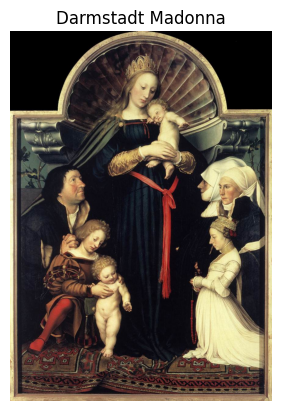

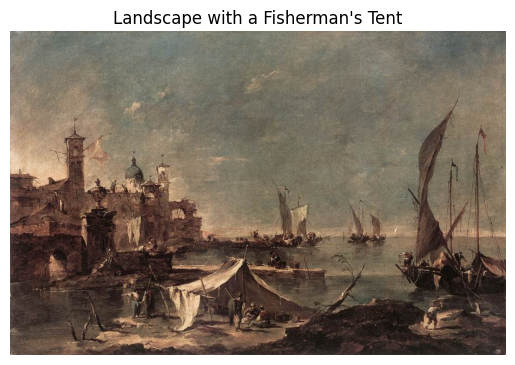

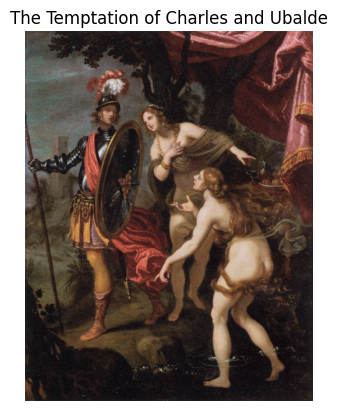

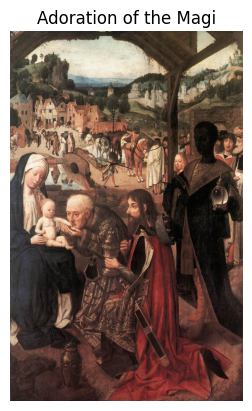

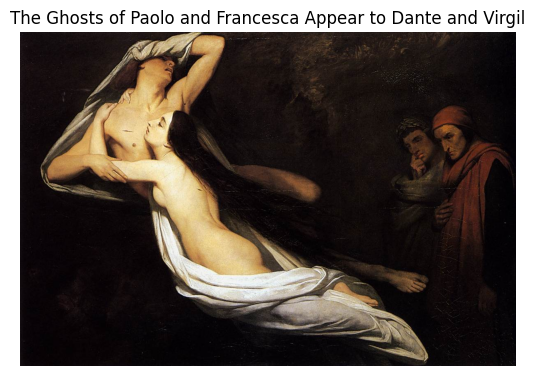

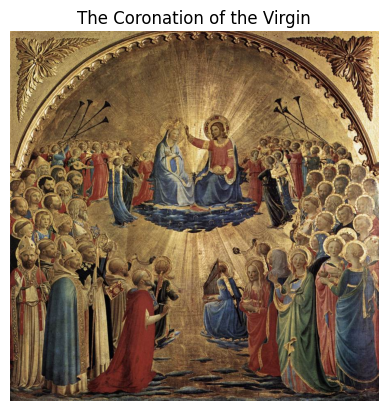

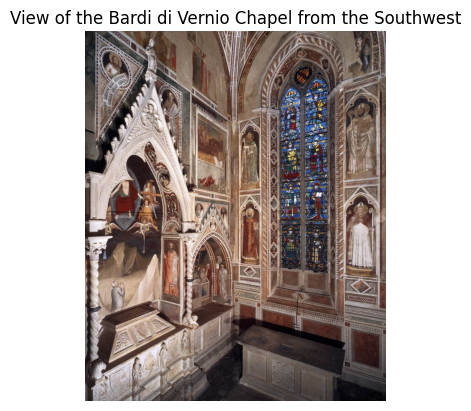

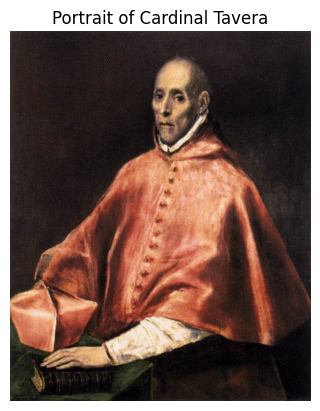

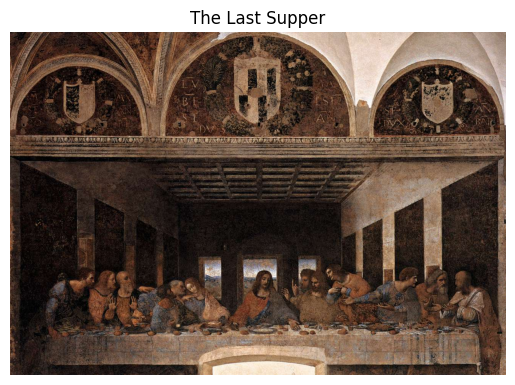

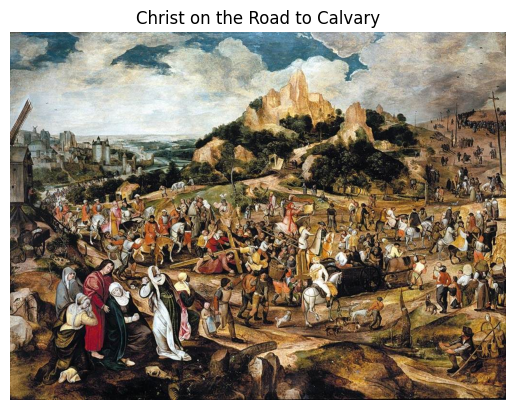


Title: Darmstadt Madonna
Wiki_Description: 
The Darmstadt Madonna (also known as the Madonna of Jakob Meyer zum Hasen) is an oil painting by Hans Holbein the Younger.[1] Completed in 1526 in Basel, the work shows the Bürgermeister of Basel Jakob Meyer zum Hasen, his first wife (who had died earlier), his current wife, and his daughter grouped around the Madonna and infant Jesus.[2][3]
The meaning of the two other male figures on the left side (the Madonna's right) is, like the overall iconography of the image, not entirely clear. Franny Moyle writes that the man on the Madonna's right is Meyer, and "[t]he boy and baby may be a presentation of Meyer's two deceased sons...."[4] The image testified to the resolutely Catholic faith of the Bürgermeister, who actively opposed the Reformation.
Holbein's Darmstadt Madonna was influenced by Italian Renaissance religious painting; Franny Moyle writes that it was influenced by Andrea Mantegna's 1496 Madonna della Vittoria, and that the two paint

In [ ]:
import requests
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt

def get_painting_description(painting_name):
    # Format the painting name for the Wikipedia URL
    formatted_name = painting_name.replace(' ', '_')

    # Construct the Wikipedia URL
    url = f"https://en.wikipedia.org/wiki/{formatted_name}"

    # Send a GET request to the URL
    response = requests.get(url)

    # Parse the HTML content using BeautifulSoup
    soup = BeautifulSoup(response.content, 'html.parser')

    # Find the first <p> tag inside the <div> with id 'mw-content-text'
    description = soup.select_one('#mw-content-text > div.mw-parser-output > p')

    if description:
        # Get the text from the first <p> block
        description_text = description.get_text().strip()

        # Find all the subsequent <p> blocks and concatenate their text
        next_paragraphs = description.find_next_siblings('p')
        for paragraph in next_paragraphs:
            description_text += "\n" + paragraph.get_text().strip()

        return description_text
    else:
        return "No description found."

# Display the first few images and crawl their descriptions
num_images_to_display = 10
for i in range(num_images_to_display):
    image = train_data.at[i, "IMAGE"]
    title = train_data.at[i, "TITLE"]

    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()
    print()

    # Crawl the wiki_description for the current title
    wiki_description = get_painting_description(title)

    # Save the description as WIKI_INFO
    train_data.at[i, "WIKI_INFO"] = wiki_description

# Print the crawled descriptions
for i in range(num_images_to_display):
    title = train_data.at[i, "TITLE"]
    wiki_description = train_data.at[i, "WIKI_INFO"]
    print(f"Title: {title}")
    print(f"Wiki_Description: {wiki_description}")
    print()

In [ ]:
# Add the wiki info as promot to llava

# Function to process an image with the LLAMA model
def process_image(image, author, title, technique, date, image_type, school, timeframe, wiki_info):
    # Resize the image to reduce its size
    resized_image = image.resize((image.width // 2, image.height // 2))  # Resize to half the original size
    index_to_class = {0: 'Abstract_Expressionism', 1: 'Action_painting', 2: 'Analytical_Cubism', 3: 'Art_Nouveau', 4: 'Baroque', 5: 'Color_Field_Painting', 6: 'Contemporary_Realism', 7: 'Cubism', 8: 'Early_Renaissance', 9: 'Expressionism', 10: 'Fauvism', 11: 'High_Renaissance', 12: 'Impressionism', 13: 'Mannerism_Late_Renaissance', 14: 'Minimalism', 15: 'Naive_Art_Primitivism', 16: 'New_Realism', 17: 'Northern_Renaissance', 18: 'Pointillism', 19: 'Pop_Art', 20: 'Post_Impressionism', 21: 'Realism', 22: 'Rococo', 23: 'Romanticism', 24: 'Symbolism', 25: 'Synthetic_Cubism', 26: 'Ukiyo_e'}
    resized = image.resize((224, 224))
    image_tensor = preprocess_image(resized)
    style_model = IntegratedModel().to(device)
    style_model.load_weights('resnet50.pth', 'beit.pth')
    style_model.eval()  # Set to evaluation mode
    with torch.no_grad():  # Disable gradient calculation to save memory and compute resources
        outputs = style_model(image_tensor.to(device))
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        predicted_class = probabilities.argmax(dim=1)  # Get the highest probability class index

    # Assuming you have a mapping from index to class names
    style = index_to_class[predicted_class.item()]
    #print("Predicted class:", style)

    # Additional text
    additional_text = f"This is a painting by {author}, titled '{title}', created using {technique} in {date}. It is a {image_type} painting from the {school} school in {style}, dating to the {timeframe}. "

    # Prompt for the LLAMA model
    prompt = f"USER: <image>\n{additional_text}\n{wiki_info}\nPlease describe the content of the picture in detail, and interpret the meaning of this painting.and you may disscuss with the following aspects:Historical and Cultural ContextDiscuss the historical period during which this painting was created. What were the significant cultural, social, or political factors at the time that might have influenced the artist's workDetailed Description and AnalysisDescribe the composition and the arrangement of figures in this painting. What does the placement of these elements suggest about the underlying themes or messages?Symbolic InterpretationIdentify and interpret any symbols present in this painting. What meanings might these symbols convey, and how do they contribute to the overall message of the artworkArtistic TechniquesAnalyze the artist's use of color, light, and shadow in this painting. How do these elements enhance the emotional or dramatic impact of the scene?Comparison with Other WorksCompare this painting to another work by the same artist or a contemporary. What similarities or differences can be observed, and what might these tell us about the artist's evolution or the artistic trends of the time?Viewer's Emotional Response:What emotions does this painting evoke? How does the artist achieve this emotional impact through the artwork's visual elements? \nASSISTANT:"

    # Prepare inputs for the LLAMA model
    inputs = processor(prompt, images=[resized_image], padding=True, return_tensors="pt").to("cuda")

    # Generate text based on the image
    output = model.generate(**inputs, max_new_tokens=1000)
    generated_text = processor.batch_decode(output, skip_special_tokens=True)
    gtext = []

    # Display the generated text
    for text in generated_text:
      protext = text.split("ASSISTANT:")[-1]
      #print(text.split("ASSISTANT:")[-1])
      gtext.append(protext.strip())
    print(gtext)

# Iterate over the first five rows in the DataFrame
for index, row in train_data.head().iterrows():
    image = row["IMAGE"]
    author = row["AUTHOR"]
    title = row["TITLE"]
    technique = row["TECHNIQUE"]
    date = row["DATE"]
    image_type = row["TYPE"]
    school = row["SCHOOL"]
    timeframe = row["TIMEFRAME"]
    wiki_info = row["WIKI_INFO"]  # Get the crawled WIKI_INFO from the dataset

    process_image(image, author, title, technique, date, image_type, school, timeframe, wiki_info)

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of BeitForImageClassification were not initialized from the model checkpoint at microsoft/beit-base-patch16-224-pt22k-ft22k and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([21841, 768]) in the checkpoint and torch.Size([27, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([21841]) in the checkpoint and torch.Size([27]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


['The painting is a religious artwork created by Hans Holbein the Younger in 1526. It features a group of people, including a woman holding a baby, and a man holding a child. The painting is titled "Darmstadt Madonna" and is a religious painting from the German school in the Post-Impressionism period, dating to the 1501-1550.\n\nThe painting\'s composition and arrangement of figures suggest a thematic focus on faith, family, and the importance of religious beliefs. The presence of the Bürgermeister of Basel, his first wife, his current wife, and his daughter around the Madonna and infant Jesus highlights the significance of religious values in the community.\n\nThe artwork\'s symbolism may include the baby Jesus as a representation of innocence and purity, while the mother represents nurturing and protection. The man holding the child could symbolize the role of the father in raising and guiding his children.\n\nHolbein\'s use of color, light, and shadow in the painting enhances the em

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of BeitForImageClassification were not initialized from the model checkpoint at microsoft/beit-base-patch16-224-pt22k-ft22k and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([21841, 768]) in the checkpoint and torch.Size([27, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([21841]) in the checkpoint and torch.Size([27]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


["The painting is a landscape scene featuring a fisherman's tent, a boat, and several people. The artist, Francesco Guardi, created this work using oil on canvas, and it is dated to the 1751-1800 period. The painting is part of the Italian school in Post-Impressionism.\n\nThe historical and cultural context of the painting suggests that it was created during a time of significant cultural, social, or political changes. The artist's work might have been influenced by the prevailing artistic trends of the time, or it could represent a specific moment in history.\n\nThe detailed description and analysis of the painting reveal that the composition features a boat, a fisherman's tent, and several people. The arrangement of these elements suggests that the underlying themes or messages of the painting revolve around the fishing industry, the daily life of the fishermen, and the connection between humans and nature.\n\nThe symbolic interpretation of the painting identifies a boat as a symbol 

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of BeitForImageClassification were not initialized from the model checkpoint at microsoft/beit-base-patch16-224-pt22k-ft22k and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([21841, 768]) in the checkpoint and torch.Size([27, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([21841]) in the checkpoint and torch.Size([27]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


["The painting depicts a scene from the story of Adam and Eve, with a man and a woman standing in front of a shield. The woman is wearing a necklace, and the man is holding a sword. The painting is a religious artwork from the Italian school, created in 1629-30.\n\nThe historical and cultural context of the painting suggests that it was created during a time when religious art was highly valued and played a significant role in society. The artist's work might have been influenced by the religious and cultural beliefs of the time.\n\nThe detailed description and analysis of the painting reveal that the man and woman are the main figures in the scene, with the woman standing closer to the viewer. The man is holding a sword, while the woman is wearing a necklace. The arrangement of these elements suggests that the underlying themes or messages of the artwork revolve around the story of Adam and Eve, with a focus on the woman's role in the narrative.\n\nThe symbolic interpretation of the p

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of BeitForImageClassification were not initialized from the model checkpoint at microsoft/beit-base-patch16-224-pt22k-ft22k and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([21841, 768]) in the checkpoint and torch.Size([27, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([21841]) in the checkpoint and torch.Size([27]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


["The painting depicts a religious scene of the Adoration of the Magi, with three kings or magi kneeling before the baby Jesus. The painting is a part of the Nativity of Jesus in art, and it is a representation of the three kings who visited the Christ child. The painting is a part of the Western Christian tradition, and it is celebrated on the Feast of the Epiphany in the church calendar.\n\nThe painting is a part of the Netherlandish school in Contemporary Realism, and it was created using Panel, 111 x 69 cm in 1480-85. The artist's use of color, light, and shadow in the painting enhances the emotional or dramatic impact of the scene. The painting is a representation of the religious significance of the Biblical story of the Magi, and it is a symbol of the recognition of Jesus as king of the earth.\n\nThe painting is a part of the Western Christian tradition, and it is celebrated on the Feast of the Epiphany in the church calendar. The painting is a representation of the religious si

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of BeitForImageClassification were not initialized from the model checkpoint at microsoft/beit-base-patch16-224-pt22k-ft22k and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([21841, 768]) in the checkpoint and torch.Size([27, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([21841]) in the checkpoint and torch.Size([27]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


["The image depicts a painting of a man and a woman, possibly a couple, lying together in a passionate embrace. The man is on top of the woman, and they appear to be kissing. The painting is a copy of a famous artwork by Ary Scheffer, which was created in 1835. The original painting is now housed in the Wallace Collection in London.\n\nThe painting captures a moment of intense passion and love between the man and the woman. The man's position on top of the woman suggests a sense of dominance or control, while the woman's relaxed posture indicates her willingness to submit to his desires. The painting evokes emotions of desire, passion, and intimacy, which are conveyed through the visual elements of the artwork, such as the use of color, light, and shadow.\n\nThe historical and cultural context of the painting is significant, as it was created during a time when artworks often portrayed scenes of passion and desire. The painting reflects the societal norms and values of the time, which 

# EVAL

## MiniCPM

In [ ]:
!pip install timm
import torch
from PIL import Image
from transformers import AutoModel, AutoTokenizer

modelCPM = AutoModel.from_pretrained('openbmb/MiniCPM-V', trust_remote_code=True)
tokenizer = AutoTokenizer.from_pretrained('openbmb/MiniCPM-V', trust_remote_code=True)
modelCPM.eval().cuda()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 11.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylin

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.05k [00:00<?, ?B/s]

configuration_minicpm.py:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V:
- configuration_minicpm.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_minicpmv.py:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

modeling_minicpm.py:   0%|          | 0.00/67.9k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V:
- modeling_minicpm.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


resampler.py:   0%|          | 0.00/5.25k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V:
- resampler.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V:
- modeling_minicpmv.py
- modeling_minicpm.py
- resampler.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


model.safetensors.index.json:   0%|          | 0.00/54.6k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/111 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.58k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/1.99M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

MiniCPMV(
  (llm): MiniCPMForCausalLM(
    (model): MiniCPMModel(
      (embed_tokens): Embedding(122753, 2304)
      (layers): ModuleList(
        (0-39): 40 x MiniCPMDecoderLayer(
          (self_attn): MiniCPMSdpaAttention(
            (q_proj): Linear(in_features=2304, out_features=2304, bias=False)
            (k_proj): Linear(in_features=2304, out_features=2304, bias=False)
            (v_proj): Linear(in_features=2304, out_features=2304, bias=False)
            (o_proj): Linear(in_features=2304, out_features=2304, bias=False)
            (rotary_emb): MiniCPMRotaryEmbedding()
          )
          (mlp): MiniCPMMLP(
            (gate_proj): Linear(in_features=2304, out_features=5760, bias=False)
            (up_proj): Linear(in_features=2304, out_features=5760, bias=False)
            (down_proj): Linear(in_features=5760, out_features=2304, bias=False)
            (act_fn): SiLU()
          )
          (input_layernorm): MiniCPMRMSNorm()
          (post_attention_layernorm): Min

In [ ]:
from PIL import Image
import numpy as np

device = torch.device("cuda") if torch.cuda.is_available() else "cpu"
idx = 1
image, img_name, author, title, technique, date, type_, school, description = train_data[idx]
image = image.unsqueeze(0).to(device, torch.float32)

image_pil = Image.fromarray(torch.mul(image.squeeze(0), 255).byte().cpu().numpy().transpose((1, 2, 0)), 'RGB')
question = (f"This painting created around {date}, is a remarkable example of the {school} school of art, describe and appreciate this {type_} painting")
print(title)
#question = (f"This painting created by {author} around {date}, named '{title}' and crafted with {technique}, is a remarkable example of the {school} school of art, can you describe and appreciate this {type_} painting?")
msgs = [{'role': 'user', 'content': question}]
print(msgs)

res, context, _ = modelCPM.chat(
    image=image_pil,
    msgs=msgs,
    context=None,
    tokenizer=tokenizer,
    sampling=True,
    temperature=0.7
)
print(res)

Landscape with a Fisherman's Tent
[{'role': 'user', 'content': 'This painting created around 1770-75, is a remarkable example of the Italian school of art, describe and appreciate this landscape painting'}]
This image depicts a beautiful landscape painting created around 1770-75, which is a remarkable example of the Italian school of art. The painting showcases the skillful use of color, composition, and perspective to create a captivating and realistic representation of nature.

The scene takes place in a forest, where the artist has skillfully depicted the interplay of light and shadow, creating a sense of depth and dimension. The colors used in the painting are vibrant and varied, with a mix of reds, oranges, yellows, and blues that add to the overall impression of a sunny day.

The foreground of the painting is dominated by trees and bushes, while the background showcases a vast expanse of forest. The artist has also incorporated elements such as rocks and a pond, adding to the com

## rouge

In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
  return "UTF-8"

locale.getpreferredencoding = getpreferredencoding
!pip install rouge
from rouge import Rouge
from collections import defaultdict

def calculate_rouge_1_scores(predictions, references):
    rouge = Rouge()
    # 计算所有ROUGE得分
    scores = rouge.get_scores(predictions, references, avg=True)
    # 只提取ROUGE-1得分
    rouge_1_scores = scores['rouge-1']
    return rouge_1_scores

In [ ]:
def process_image(image, author, title, technique, date, image_type, school, timeframe, wiki_info):
    # Resize the image to reduce its size
    resized_image = image.resize((image.width // 2, image.height // 2))  # Resize to half the original size
    index_to_class = {0: 'Abstract_Expressionism', 1: 'Action_painting', 2: 'Analytical_Cubism', 3: 'Art_Nouveau', 4: 'Baroque', 5: 'Color_Field_Painting', 6: 'Contemporary_Realism', 7: 'Cubism', 8: 'Early_Renaissance', 9: 'Expressionism', 10: 'Fauvism', 11: 'High_Renaissance', 12: 'Impressionism', 13: 'Mannerism_Late_Renaissance', 14: 'Minimalism', 15: 'Naive_Art_Primitivism', 16: 'New_Realism', 17: 'Northern_Renaissance', 18: 'Pointillism', 19: 'Pop_Art', 20: 'Post_Impressionism', 21: 'Realism', 22: 'Rococo', 23: 'Romanticism', 24: 'Symbolism', 25: 'Synthetic_Cubism', 26: 'Ukiyo_e'}
    resized = image.resize((224, 224))
    image_tensor = preprocess_image(resized)
    style_model = IntegratedModel().to(device)
    style_model.load_weights('resnet50.pth', 'beit.pth')
    style_model.eval()  # Set to evaluation mode
    with torch.no_grad():  # Disable gradient calculation to save memory and compute resources
        outputs = style_model(image_tensor.to(device))
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        predicted_class = probabilities.argmax(dim=1)  # Get the highest probability class index

    # Assuming you have a mapping from index to class names
    style = index_to_class[predicted_class.item()]
    #print("Predicted class:", style)

    # Additional text
    additional_text = f"This is a painting by {author}, titled '{title}', created using {technique} in {date}. It is a {image_type} painting from the {school} school in {style}, dating to the {timeframe}. "

    # Prompt for the LLAMA model
    prompt = f"USER: <image>\n{additional_text}\n{wiki_info}\nPlease describe the content of the picture in detail, and interpret the meaning of this painting.and you may disscuss with the following aspects:Historical and Cultural ContextDiscuss the historical period during which this painting was created. What were the significant cultural, social, or political factors at the time that might have influenced the artist's workDetailed Description and AnalysisDescribe the composition and the arrangement of figures in this painting. What does the placement of these elements suggest about the underlying themes or messages?Symbolic InterpretationIdentify and interpret any symbols present in this painting. What meanings might these symbols convey, and how do they contribute to the overall message of the artworkArtistic TechniquesAnalyze the artist's use of color, light, and shadow in this painting. How do these elements enhance the emotional or dramatic impact of the scene?Comparison with Other WorksCompare this painting to another work by the same artist or a contemporary. What similarities or differences can be observed, and what might these tell us about the artist's evolution or the artistic trends of the time?Viewer's Emotional Response:What emotions does this painting evoke? How does the artist achieve this emotional impact through the artwork's visual elements? \nASSISTANT:"

    # Prepare inputs for the LLAMA model
    inputs = processor(prompt, images=[resized_image], padding=True, return_tensors="pt").to("cuda")

    # Generate text based on the image
    output = model.generate(**inputs, max_new_tokens=1000)
    generated_text = processor.batch_decode(output, skip_special_tokens=True)
    gtext = []

    # Display the generated text
    for text in generated_text:
      protext = text.split("ASSISTANT:")[-1]
      #print(text.split("ASSISTANT:")[-1])
      gtext.append(protext.strip())
    gstring = "\n".join(gtext)
    #print(gstring)
    return gstring

In [ ]:
all_f = []
all_p = []
all_r = []

for i in range(len(val_data)):
  row = train_data.iloc[i]

  image = row["IMAGE"]
  author = row["AUTHOR"]
  title = row["TITLE"]
  technique = row["TECHNIQUE"]
  date = row["DATE"]
  image_type = row["TYPE"]
  school = row["SCHOOL"]
  timeframe = row["TIMEFRAME"]
  wiki_info = row["WIKI_INFO"]  # Get the crawled WIKI_INFO from the dataset
  description = row["DESCRIPTION"]

  caption = process_image(image, author, title, technique, date, image_type, school, timeframe, wiki_info)
  #caption = "The painting is a landscape scene featuring a mountainous area with a forest in the background. There are several people scattered throughout the scene, with some closer to the foreground and others further away. The painting is a Flemish school in Romanticism, created by Jan Baptist Huysmans in 1651-1700.The historical and cultural context of the painting suggests that it was created during a time of significant cultural, social, or political changes. The Romanticism movement, which emerged in the late 18th century, emphasized the emotional response of the viewer and the connection between nature and human experience. The painting's focus on the landscape and the people within it reflects this artistic movement's emphasis on the power of nature and the human connection to it.The detailed description and analysis of the painting reveal that the composition is well-balanced, with the mountainous area and the forest in the background creating a sense of depth and space. The figures in the foreground add a human element to the scene, creating a sense of scale and connection to the natural world. The artist's use of color, light, and shadow enhances the emotional impact of the scene, creating a sense of tranquility and harmony with nature.The symbolic interpretation of the painting identifies the forest as a symbol of the unknown and the mysterious. The people in the scene represent humanity's connection to nature and the need to find balance and harmony with the natural world. The artist's use of color, light, and shadow adds to the emotional impact of the scene, creating a sense of tranquility and harmony with nature.The artistic techniques used by the artist include the use of color, light, and shadow to create a sense of depth and space in the scene. The artist's use of perspective and composition adds to the emotional impact of the scene, creating a sense of tranquility and harmony with nature. The painting's comparison with other works by the same artist or contemporary reveals similarities and differences in the artist's style and the artistic trends of the time.The viewer's emotional response to the painting is one of tranquility and harmony with nature. The artist achieves this emotional impact through the artwork's visual elements, including the composition, color,"
  caption_reference = description

  score1 = calculate_rouge_1_scores(caption, caption_reference)

  #print(caption_reference)
  all_f.append(score1['f'])
  all_p.append(score1['p'])
  all_r.append(score1['r'])

avg_f = sum(all_f) / len(all_f)
avg_p = sum(all_p) / len(all_p)
avg_r = sum(all_r) / len(all_r)

print("Average ROUGE-1 F1 Score:", avg_f)
print("Average ROUGE-1 P1 Score:", avg_p)
print("Average ROUGE-1 R1 Score:", avg_r)

Average ROUGE-1 F1 Score: 0.12501861018350166
Average ROUGE-1 P1 Score: 0.15935724937704661
Average ROUGE-1 R1 Score: 0.32653359814630917


## metero

In [ ]:
!pip install nltk
import nltk
from nltk.translate.meteor_score import meteor_score

nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
all_score = 0
for i in range(len(val_data)):
  row = train_data.iloc[i]

  image = row["IMAGE"]
  author = row["AUTHOR"]
  title = row["TITLE"]
  technique = row["TECHNIQUE"]
  date = row["DATE"]
  image_type = row["TYPE"]
  school = row["SCHOOL"]
  timeframe = row["TIMEFRAME"]
  wiki_info = row["WIKI_INFO"]  # Get the crawled WIKI_INFO from the dataset
  description = row["DESCRIPTION"]

  caption = process_image(image, author, title, technique, date, image_type, school, timeframe, wiki_info)
  #caption = "The painting is a landscape scene featuring a mountainous area with a forest in the background. There are several people scattered throughout the scene, with some closer to the foreground and others further away. The painting is a Flemish school in Romanticism, created by Jan Baptist Huysmans in 1651-1700.The historical and cultural context of the painting suggests that it was created during a time of significant cultural, social, or political changes. The Romanticism movement, which emerged in the late 18th century, emphasized the emotional response of the viewer and the connection between nature and human experience. The painting's focus on the landscape and the people within it reflects this artistic movement's emphasis on the power of nature and the human connection to it.The detailed description and analysis of the painting reveal that the composition is well-balanced, with the mountainous area and the forest in the background creating a sense of depth and space. The figures in the foreground add a human element to the scene, creating a sense of scale and connection to the natural world. The artist's use of color, light, and shadow enhances the emotional impact of the scene, creating a sense of tranquility and harmony with nature.The symbolic interpretation of the painting identifies the forest as a symbol of the unknown and the mysterious. The people in the scene represent humanity's connection to nature and the need to find balance and harmony with the natural world. The artist's use of color, light, and shadow adds to the emotional impact of the scene, creating a sense of tranquility and harmony with nature.The artistic techniques used by the artist include the use of color, light, and shadow to create a sense of depth and space in the scene. The artist's use of perspective and composition adds to the emotional impact of the scene, creating a sense of tranquility and harmony with nature. The painting's comparison with other works by the same artist or contemporary reveals similarities and differences in the artist's style and the artistic trends of the time.The viewer's emotional response to the painting is one of tranquility and harmony with nature. The artist achieves this emotional impact through the artwork's visual elements, including the composition, color,"
  caption_reference = description

  caption_tokens = nltk.word_tokenize(caption.lower())
  reference_tokens = nltk.word_tokenize(caption_reference.lower())

  score = meteor_score([reference_tokens], caption_tokens)
  #print("METEOR Score:", score)
  all_score = all_score + score

avg = all_score/len(val_data)
print("Average METERO Score:", avg_f)

Some weights of ViTForImageClassification were not initialized from the model 
checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: 
['classifier.bias', 'classifier.weight'] You should probably TRAIN this model 
on a down-stream task to be able to use it for predictions and inference.
Some weights of BeitForImageClassification were not initialized from the model 
checkpoint at microsoft/beit-base-patch16-224-pt22k-ft22k and are newly initialized 
because the shapes did not match: - classifier.weight: found shape torch.Size([21841, 768]) 
in the checkpoint and torch.Size([27, 768]) in the model instantiated - classifier.bias: 
found shape torch.Size([21841]) in the checkpoint and torch.Size([27]) in the model instantiated 
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
METEOR Score: 0.2423572493770466
